# Importing

In [1]:
import h5py
import numpy as np
data_path = "/local/scratch/Data/TROPHY/"
f = h5py.File(data_path + 'Minerva_Allsamples_Stroma_NM_25smooth.mat')

In [3]:
coords = np.array(f['pixelCoords'], dtype=np.int16)
sample_num = np.array(f['SampleNum'], dtype=np.int16)
# wavenumbers = np.array(f['wavenumbers'], dtype=np.int16)
classification_group = []
num_active_pixels = len(f['SamplePath'][0])
for i in range(0, num_active_pixels):
    ref = f['SamplePath'][0,i]
    a = f[ref]
    classification_group.append(np.array(a).item())
    if i % 1000 == 0:
        print(i)
# classification_group = np.int16(classification_group)
# data = np.array(f['DATA'])

0
1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000
25000
26000
27000
28000
29000
30000
31000
32000
33000
34000
35000
36000
37000
38000
39000
40000
41000
42000
43000
44000
45000
46000
47000
48000
49000
50000
51000
52000
53000
54000
55000
56000
57000
58000
59000
60000
61000
62000
63000
64000
65000
66000
67000
68000
69000
70000
71000
72000
73000
74000
75000
76000
77000
78000
79000
80000
81000
82000
83000
84000
85000
86000
87000
88000
89000
90000
91000
92000
93000
94000
95000
96000
97000
98000
99000
100000
101000
102000
103000
104000
105000
106000
107000
108000
109000
110000
111000
112000
113000
114000
115000
116000
117000
118000
119000
120000
121000
122000
123000
124000
125000
126000
127000
128000
129000
130000
131000
132000
133000
134000
135000
136000
137000
138000
139000
140000
141000
142000
143000
144000
145000
146000
147000
148000
149000
150000
151000
152000
153000
154000
155000
156000
157000
158000


In [4]:
classification_group = np.int16(classification_group)
print(classification_group)
data = np.array(f['DATA'])

[3 3 3 ... 4 4 4]


In [5]:
print(f.keys())

<KeysViewHDF5 ['#refs#', '#subsystem#', 'BIGTOTAL', 'C', 'Clusters', 'DATA', 'Folders', 'MAG', 'NAMESKM', 'SAMPLE_LIST', 'SampleGroup', 'SampleNum', 'SamplePath', 'X', 'Y', 'ans', 'f', 'files', 'files2', 'i', 'j', 'k', 'names', 'names2', 'out', 'pC', 'pR', 'pathname', 'pixelCoords', 'structname', 'z']>


In [6]:
print(len(coords))
print(sample_num)
print(classification_group)

2
[[ 1  1  1 ... 90 90 90]]
[3 3 3 ... 4 4 4]


In [7]:
save_directory = "/local/scratch/Data/TROPHY/numpy/"
np.save(save_directory + "stroma_data", data)
np.save(save_directory + "stroma_classification", classification_group)
np.save(save_directory + "stroma_coords", coords)
np.save(save_directory + "stroma_sample_num", sample_num)
# np.save(save_directory + "wavenumbers", wavenumbers)


# Exploring

In [9]:
save_directory = "/local/scratch/Data/TROPHY/numpy/"
data = np.load(save_directory + "data.npy")
classification = np.load(save_directory + "classification.npy")
coords = np.load(save_directory + "coords.npy")
sample_num = np.load(save_directory + "sample_num.npy")
wavenumbers = np.load(save_directory + "wavenumbers.npy")
data = np.load(save_directory + "stroma_data.npy")
classification = np.load(save_directory + "stroma_classification.npy")
coords = np.load(save_directory + "stroma_coords.npy")
sample_num = np.load(save_directory + "stroma_sample_num.npy")


In [31]:

# import matplotlib.pyplot as plt
# print(loop_points[0])
# print(coords[1])
# layer1 = np.zeros([128,128])
# xs = coords[0][0:loop_points[2]]-1
# ys = coords[1][0:loop_points[2]]-1
# layer_coords = np.vstack([xs, ys])
# for i, x in enumerate(xs):
#     layer1[x, ys[i]]=1
# # print(layer_coords)
# # layer1[layer_coords]=1
# # print(layer1[layer_coords])

# plt.imshow(layer1)




In [10]:
%load_ext autoreload
import sys
import os
parent_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))
sys.path.insert(0, parent_dir)
from Processing.Sample import Sample
interest_indices = np.where(sample_num == 1)
print(interest_indices[1])
print(coords[1])
coord_loop_points = np.where(coords[1][1:] < coords[1][:-1])[0]
coord_loop_points = np.append(coord_loop_points, len(coords[1])-1)
sample_loop_points = np.where(sample_num[0][1:] > sample_num[0][:-1])[0]
sample_loop_points = np.append(sample_loop_points, len(coords[1])-1)
print(len(coords[1]))
print(sample_num)
print(sample_loop_points)

# class Sample:
#     def __init__(self, start_index, end_index, layer_ends, x_size, y_size):
#         self.start_index = start_index
#         self.end_index = end_index
#         self.layer_ends = layer_ends
#         self.x_size = x_size
#         self.y_size = y_size
#         self.num_layers = len(layer_ends)
#         self.layer_range = self.calculate_layer_ranges()

#     def calculate_layer_ranges(self):
#         layer_starts = np.append([self.start_index], np.int64(np.array(self.layer_ends[:-1]) + 1))
#         # print(layer_starts)
#         # print(self.layer_ends)
#         layer_ranges = []
#         for i, layer_start in enumerate(layer_starts):
#             layer_ranges.append(range(layer_start, self.layer_ends[i]))
#         return layer_ranges

samples = []
sample_coord_loop_points = []
start_index = 0
for loop_point in coord_loop_points:
    sample_coord_loop_points.append(loop_point)
    # print(loop_point, sample_num[0][loop_point])
    if loop_point in sample_loop_points:
        sample_range = np.arange(start_index, loop_point+1).tolist()
        max_x = np.max(coords[0][sample_range])
        max_y = np.max(coords[1][sample_range])
        # print(max_x, max_y)
        finished_sample = Sample(start_index, loop_point, sample_coord_loop_points, max_x, max_y)
        
        samples.append(finished_sample)
        start_index = loop_point + 1
        sample_coord_loop_points = []
        # print("New Sample")

[   0    1    2 ... 8734 8735 8736]
[  1   1   1 ... 226 226 227]
1032116
[[ 1  1  1 ... 90 90 90]]
[   8736   20093   31791   48794   54103   59586   73348   78191   85932
   93390  108404  113201  124756  136417  147479  160718  163369  189535
  194838  202437  215618  226811  240317  246463  255166  311352  329133
  341471  357724  360826  378325  383284  410860  433931  448572  453993
  456893  463944  467136  471652  494934  498173  517785  528549  529076
  536542  550209  554993  561871  573926  584313  592028  594404  610145
  615595  618850  631506  641159  648521  654433  662362  668858  702753
  709090  715504  725552  744108  751708  767038  774975  778881  783498
  786139  788302  788660  838303  868262  891718  902047  921176  930716
  936304  949978  965583  979048  984721  998468 1011020 1026457 1032115]


In [11]:
np.save(save_directory + "stroma_samples", samples)

# Visualisation

In [12]:
%load_ext autoreload
save_directory = "/local/scratch/Data/TROPHY/numpy/"
from Processing.Sample import Sample
import matplotlib.pyplot as plt
import numpy as np
samples = np.load(save_directory + "stroma_samples.npy", allow_pickle = True)
coords = np.load(save_directory + "stroma_coords.npy")
data = np.load(save_directory + "stroma_data.npy")
classification = np.load(save_directory + "stroma_classification.npy")
print(samples[0].layer_range)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
[range(0, 8736)]


[range(0, 2445), range(2446, 3348), range(3349, 4466)]


In [13]:
s1 = samples[1].calculate_layer_view(3, coords, 1)
print(np.mean(s1))
plt.imshow(s1)

IndexError: list index out of range

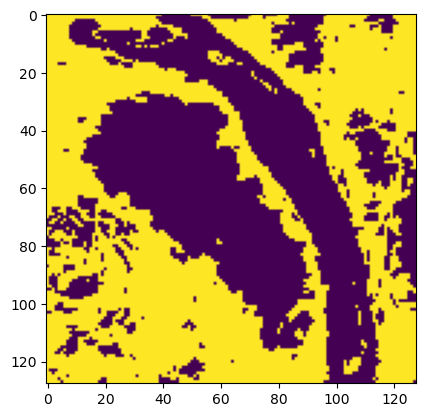

In [16]:
s2 = samples[0].calculate_full_view(coords)
plt.imshow(s2)
plt.show()

(801, 1032116)
0


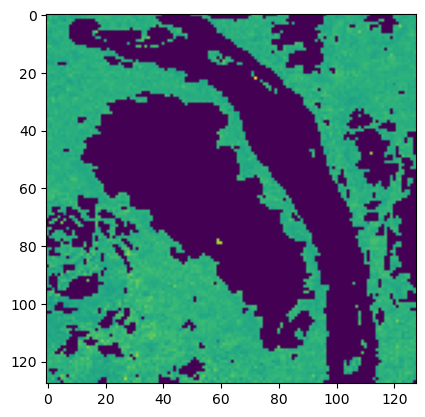

1


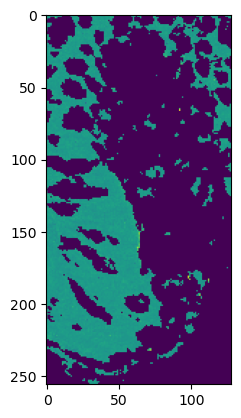

2


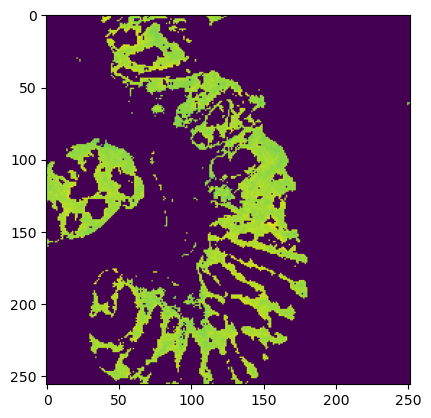

3


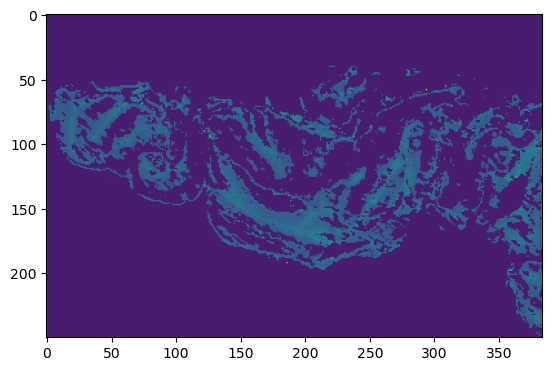

4


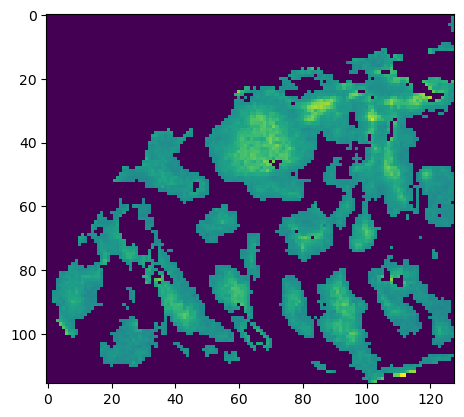

5


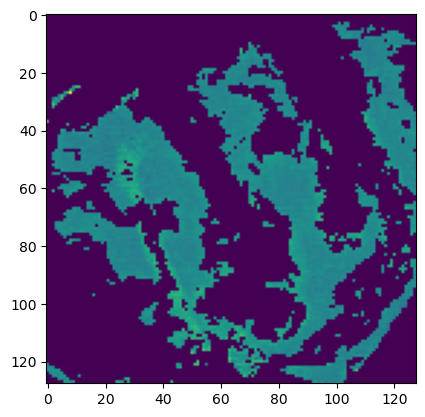

6


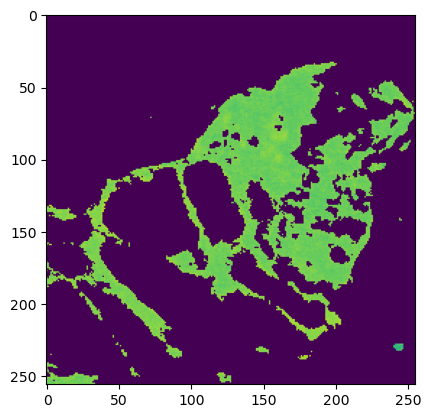

7


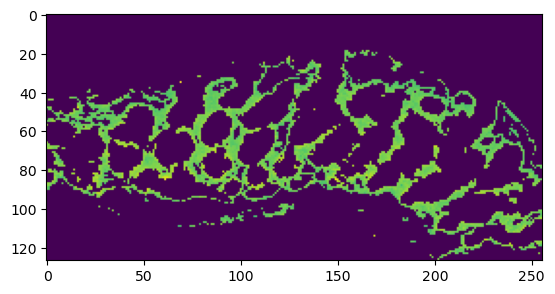

8


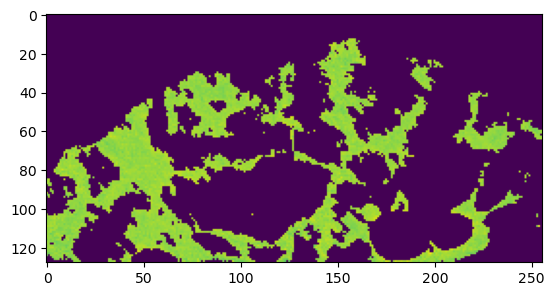

9


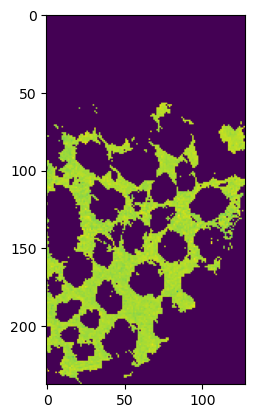

10


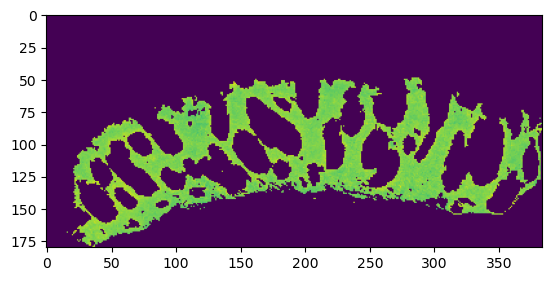

11


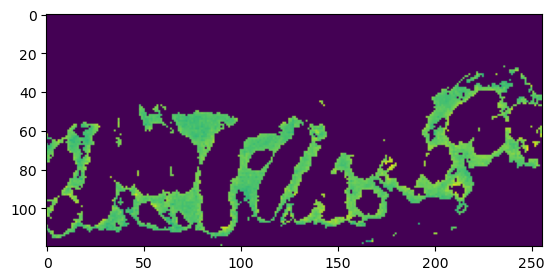

12


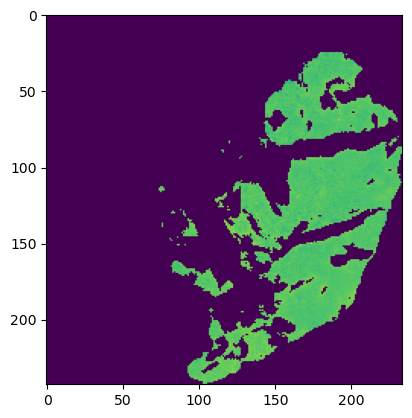

13


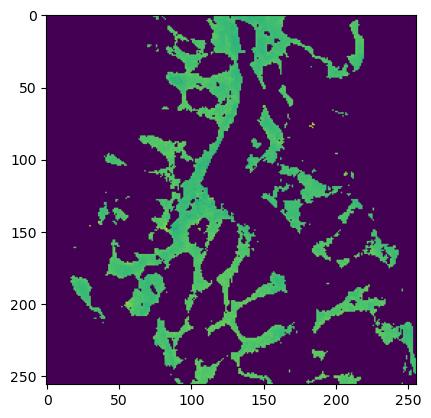

14


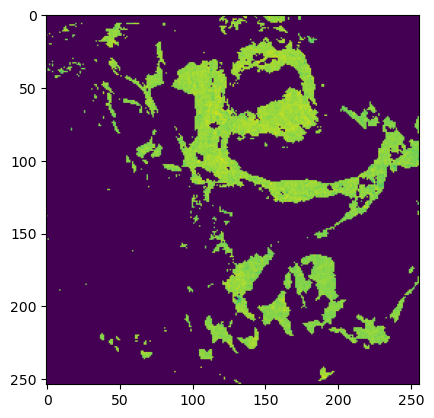

15


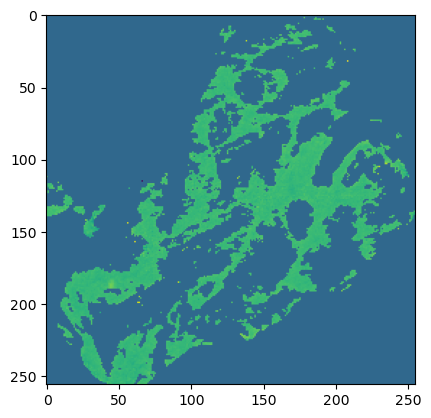

16


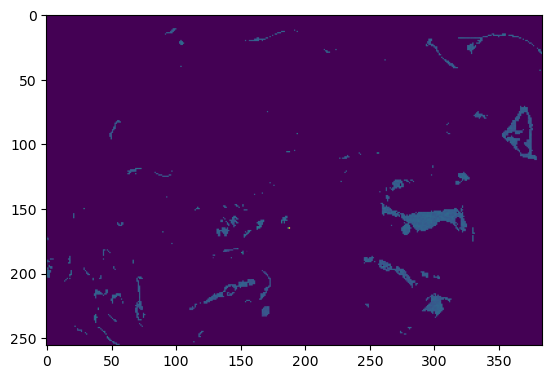

17


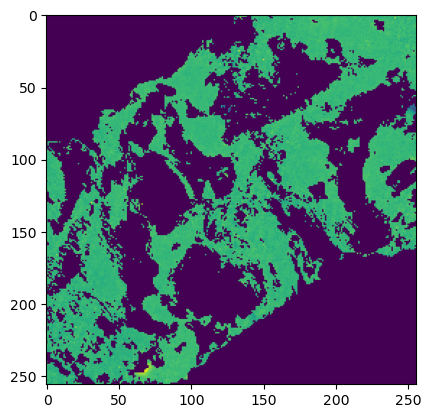

18


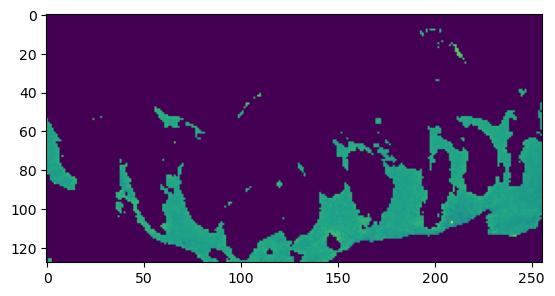

19


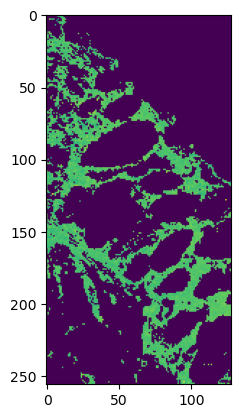

20


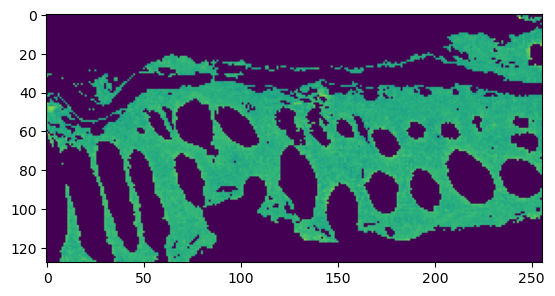

21


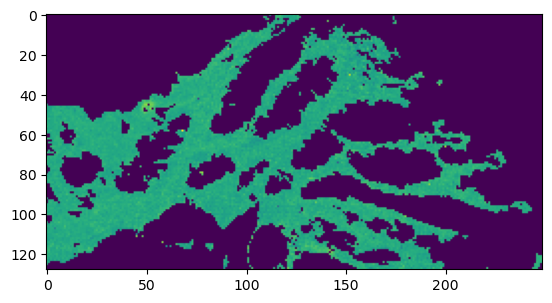

22


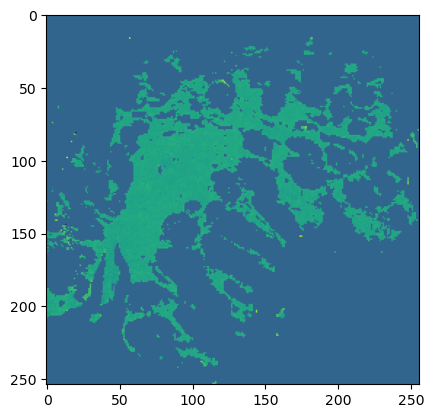

23


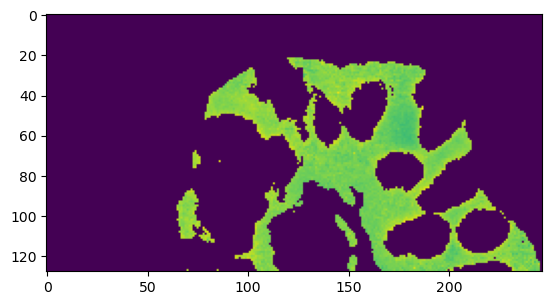

24


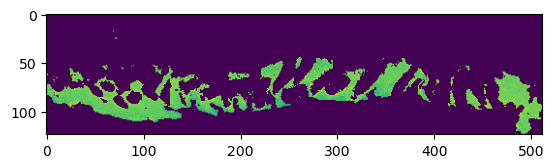

25


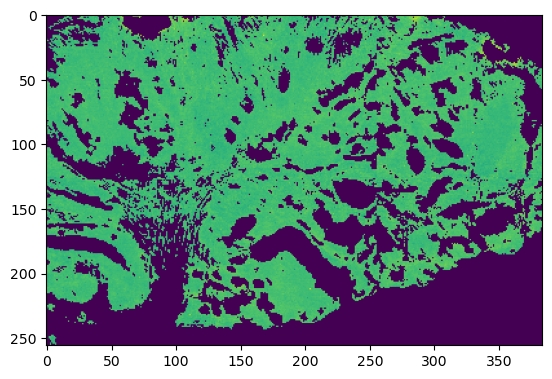

26


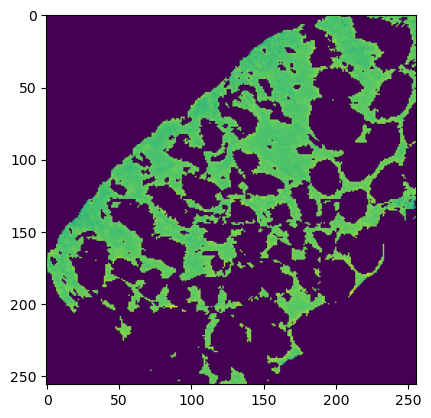

27


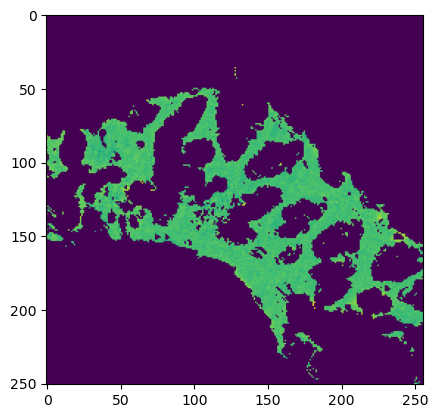

28


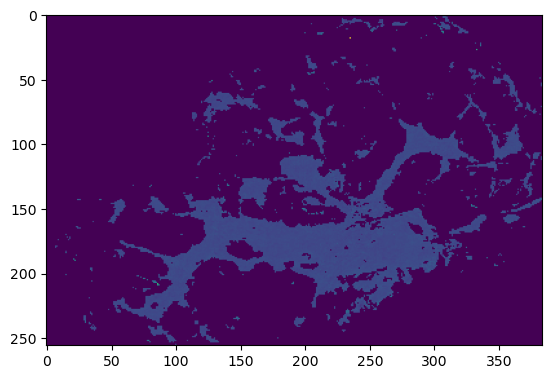

29


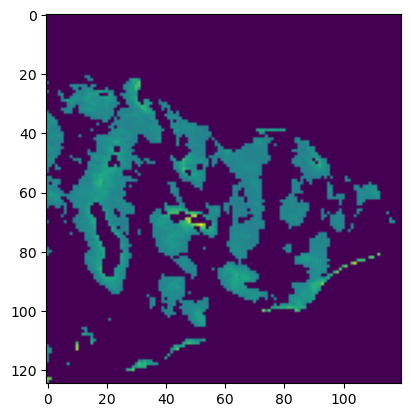

30


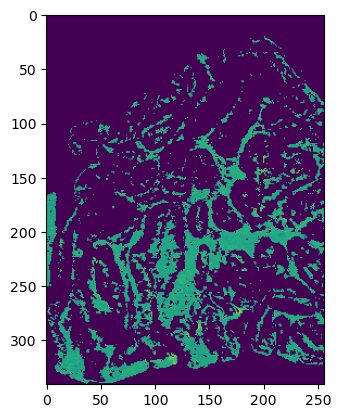

31


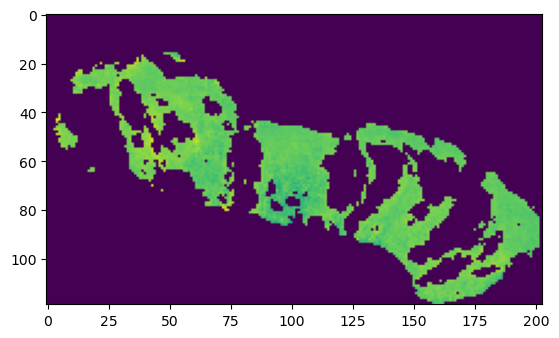

32


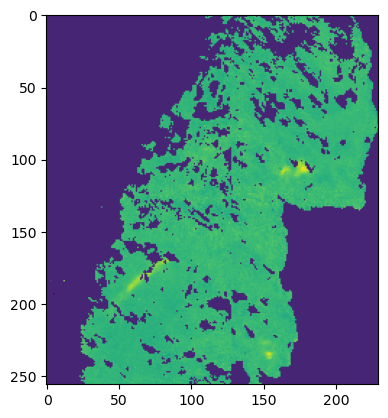

33


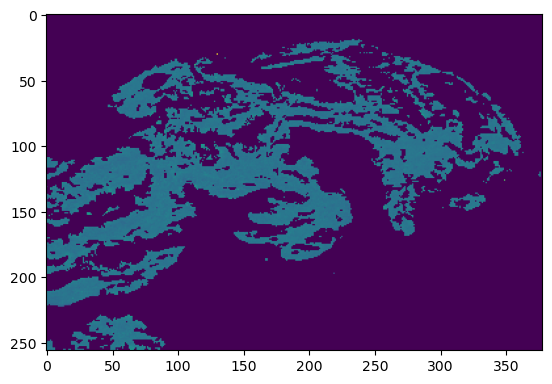

34


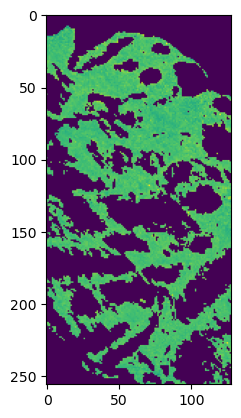

35


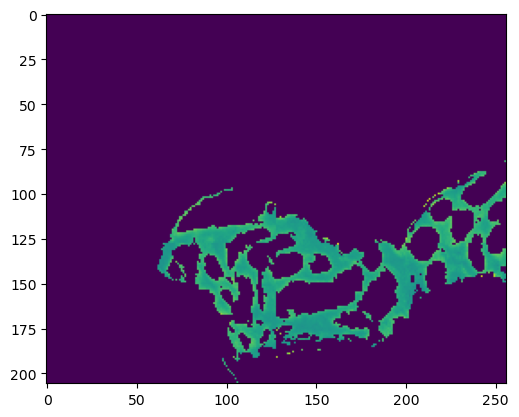

36


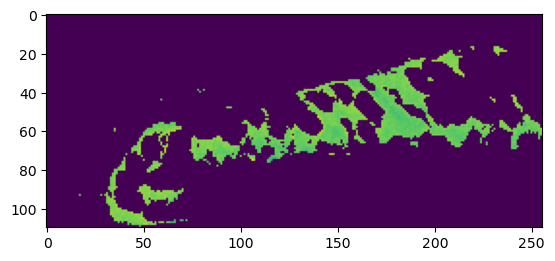

37


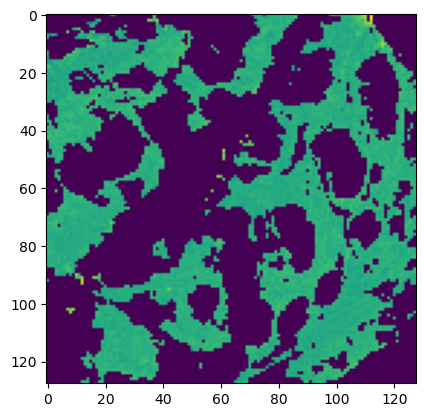

38


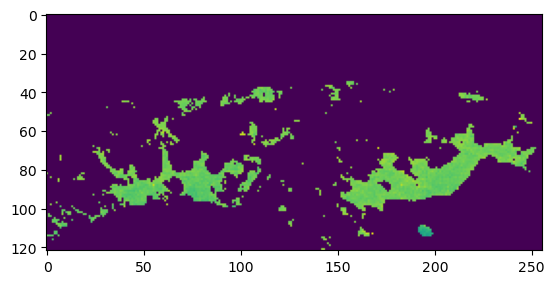

39


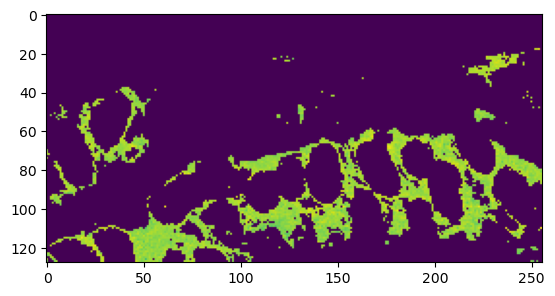

40


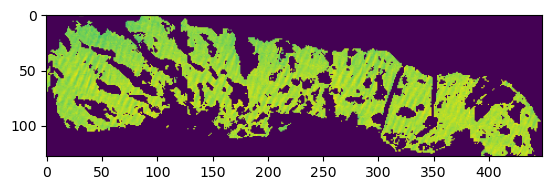

41


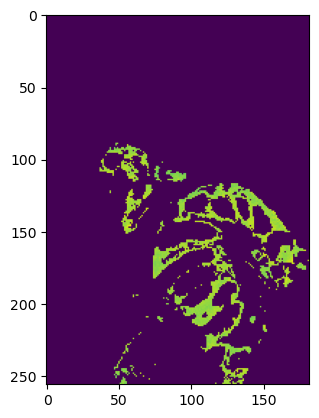

42


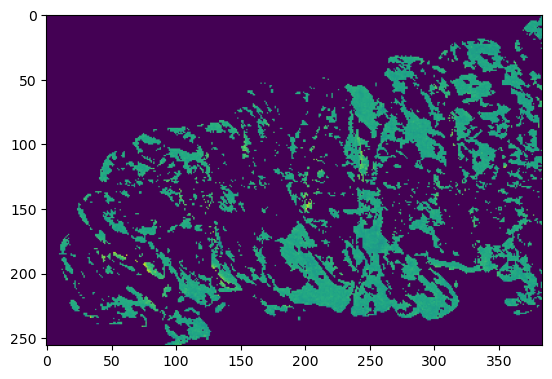

43


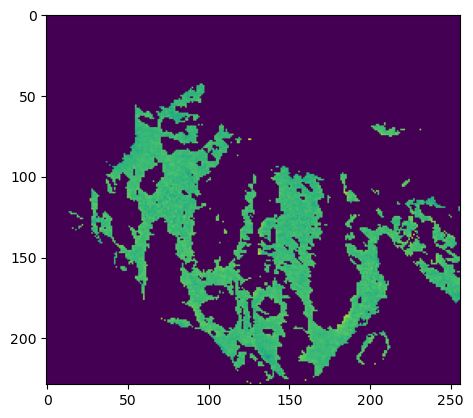

44


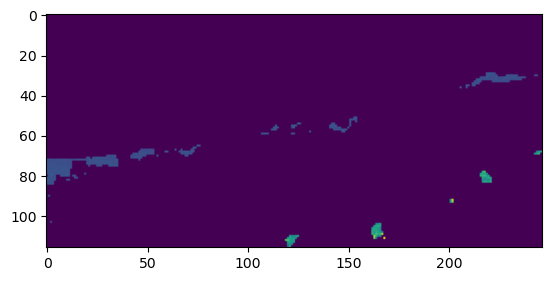

45


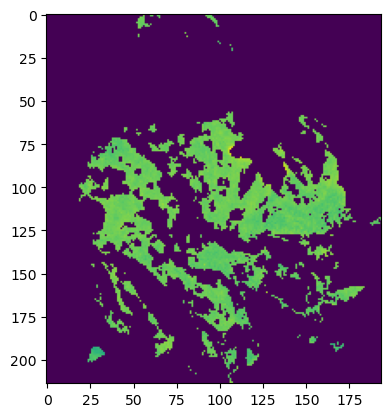

46


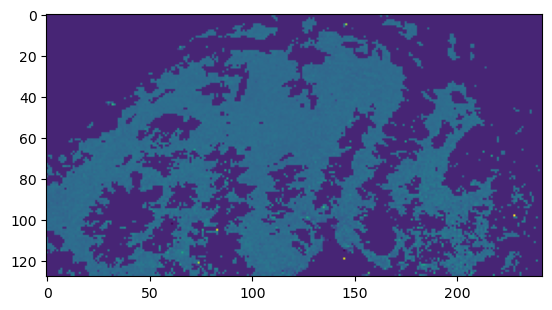

47


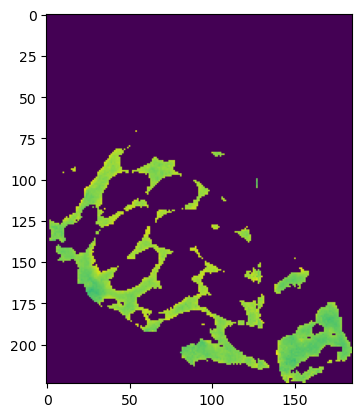

48


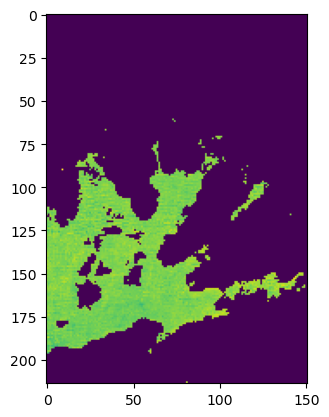

49


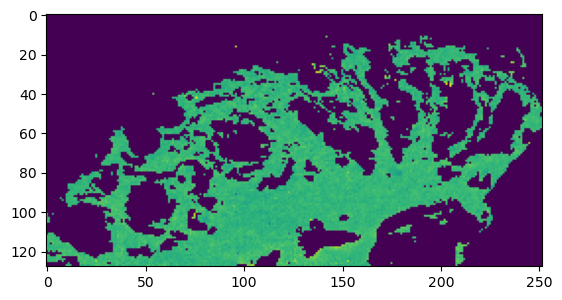

50


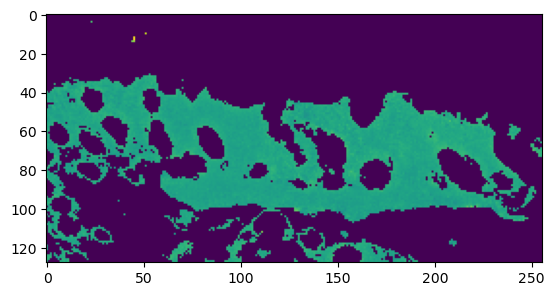

51


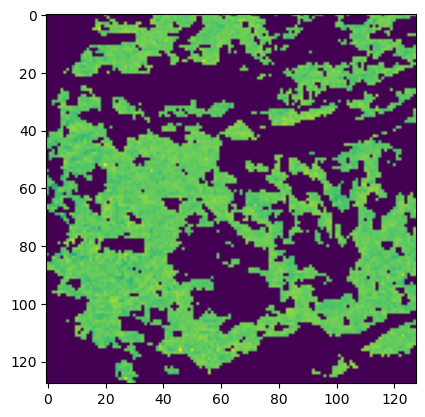

52


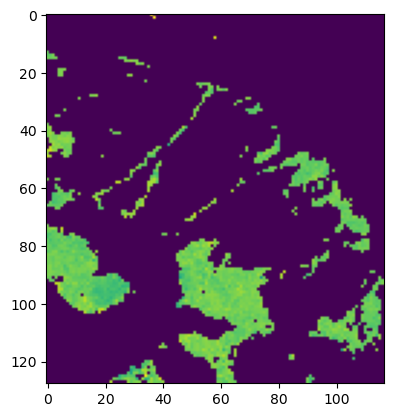

53


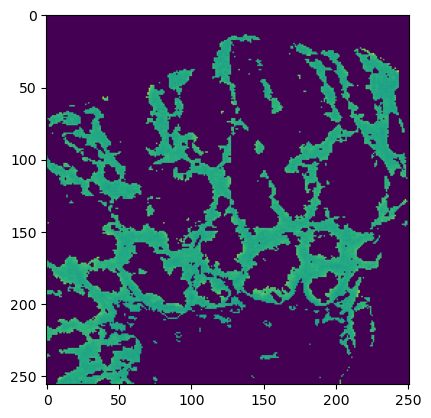

54


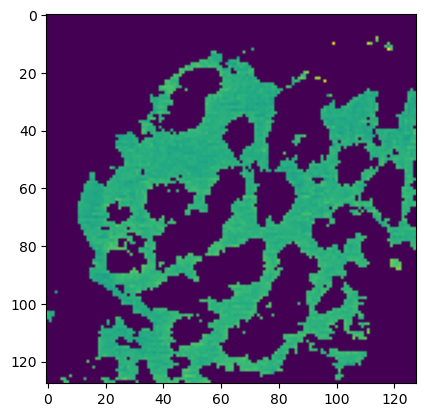

55


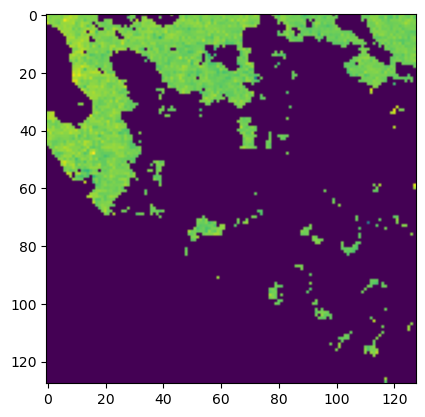

56


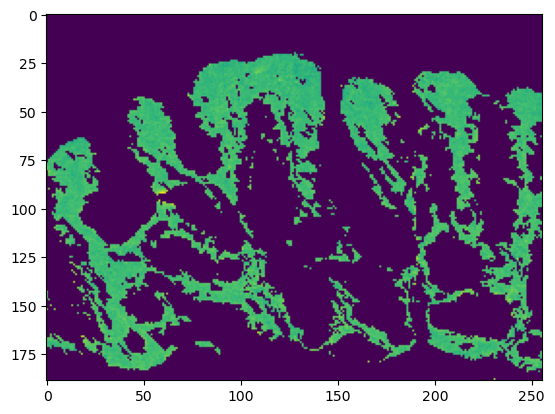

57


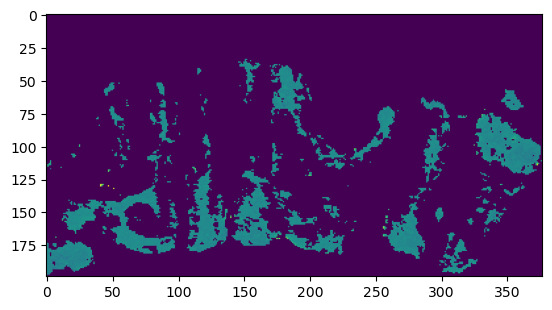

58


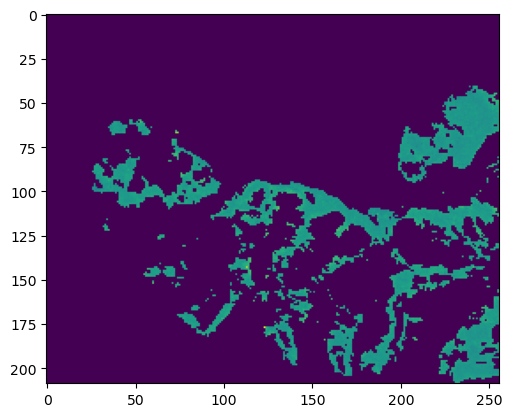

59


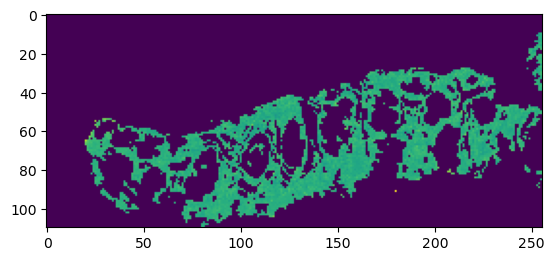

60


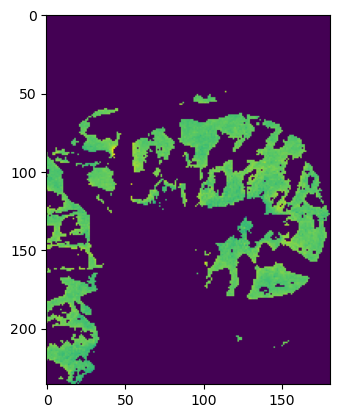

61


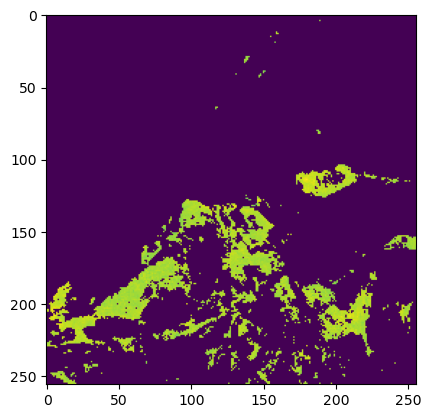

62


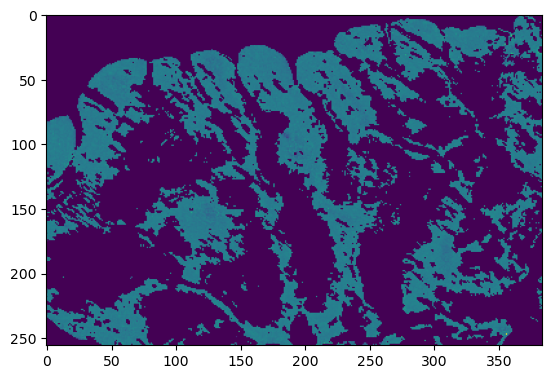

63


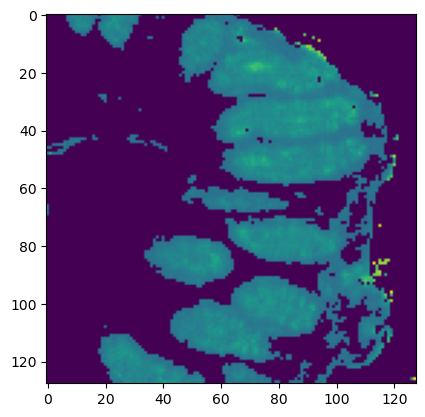

64


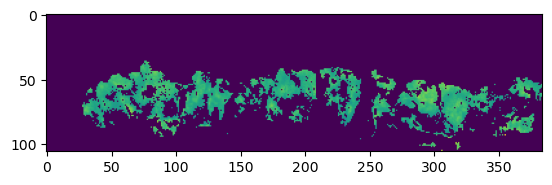

65


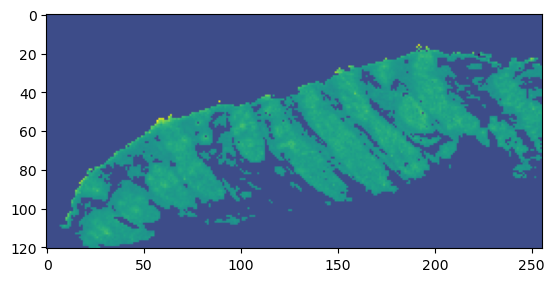

66


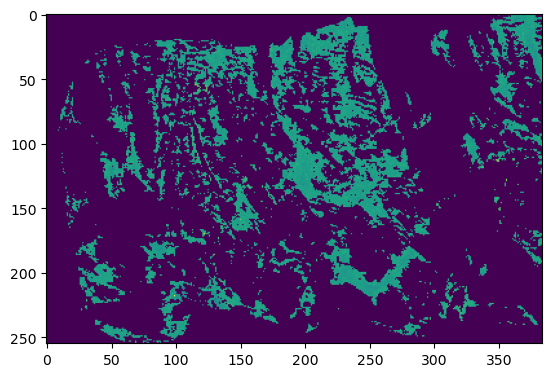

67


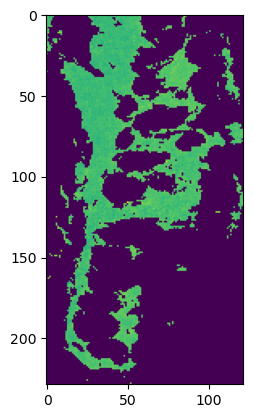

68


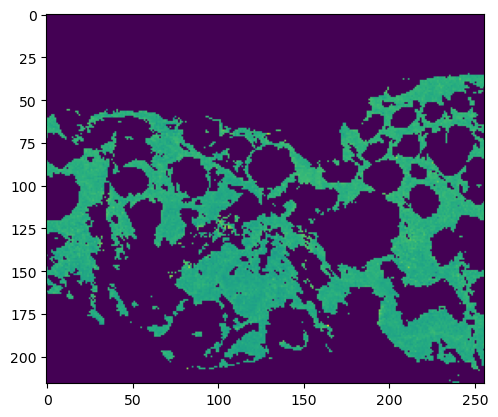

69


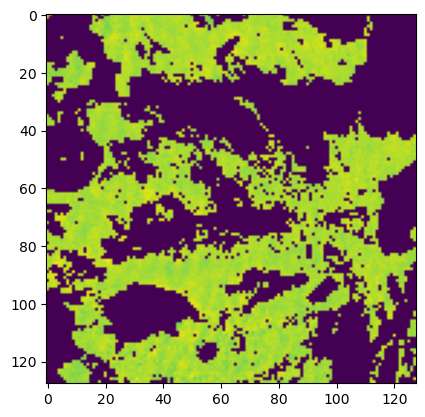

70


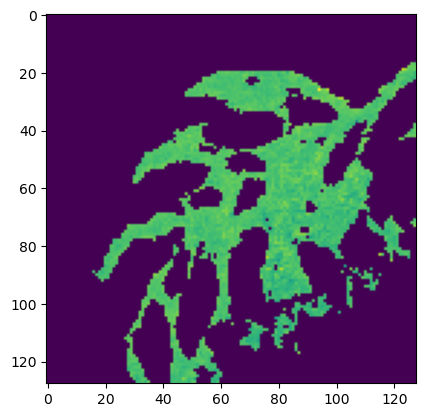

71


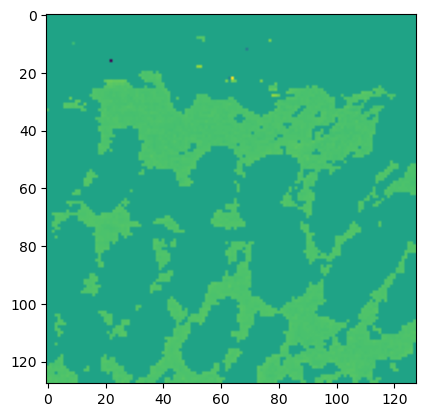

72


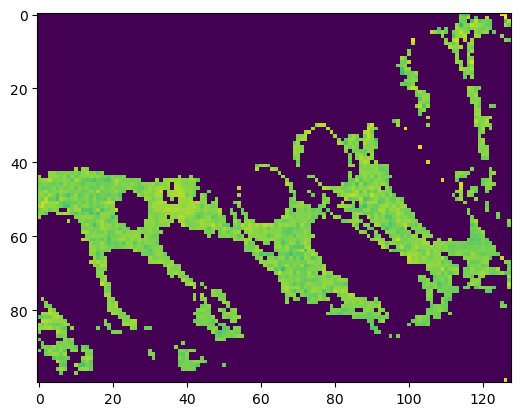

73


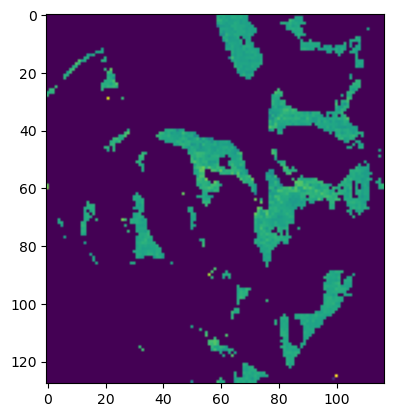

74


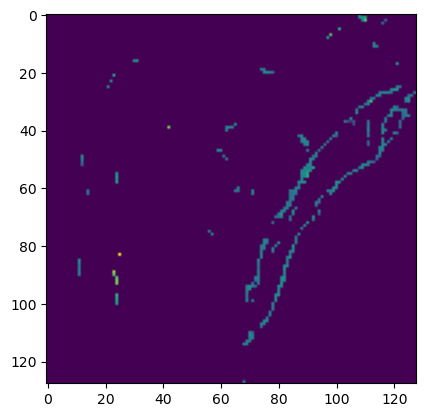

75


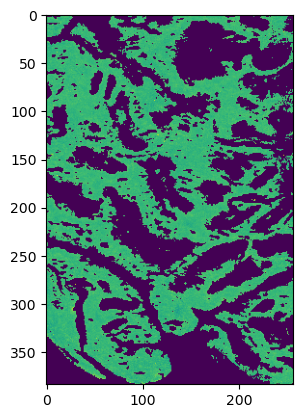

76


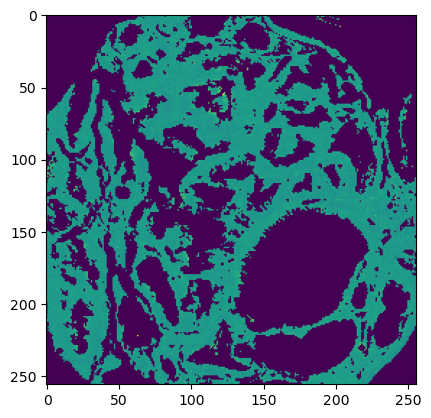

77


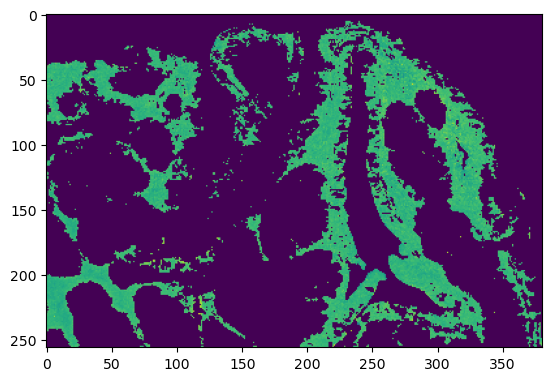

78


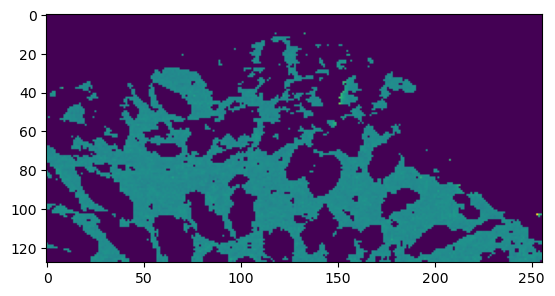

79


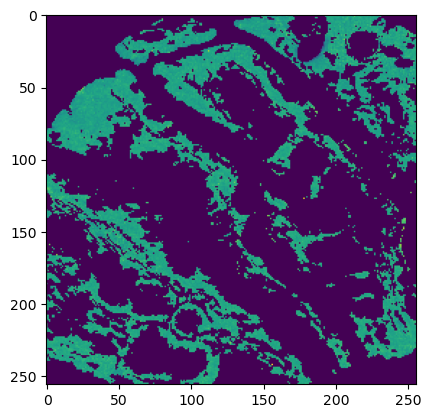

80


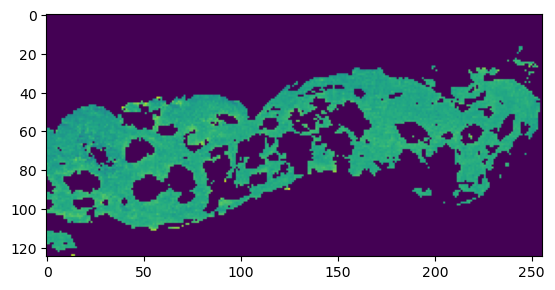

81


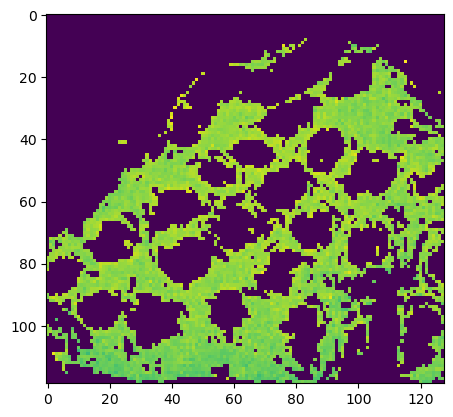

82


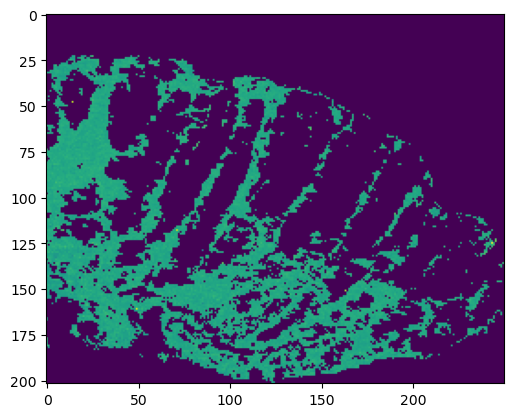

83


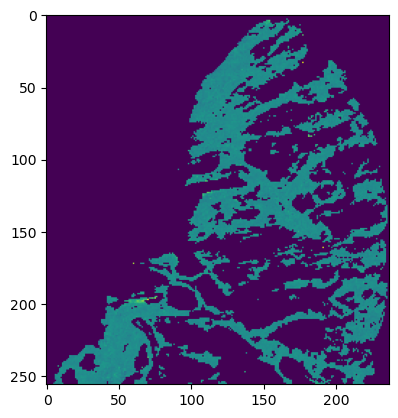

84


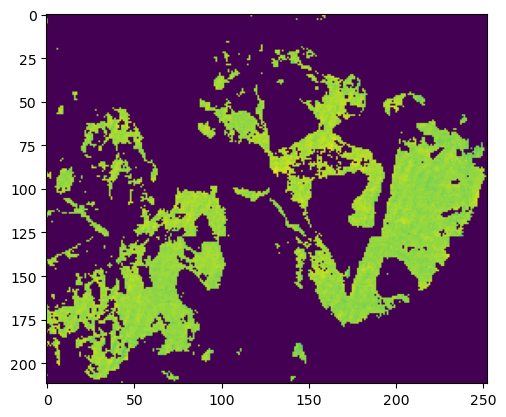

85


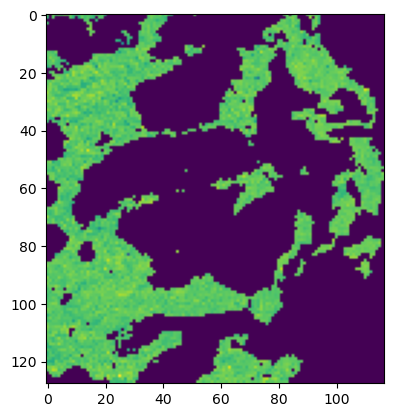

86


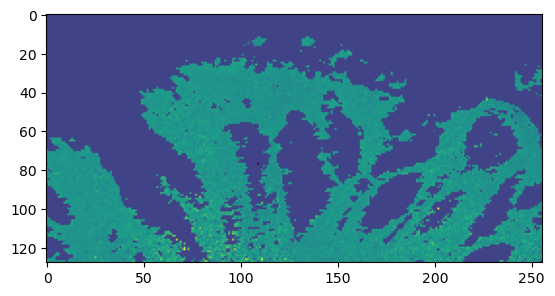

87


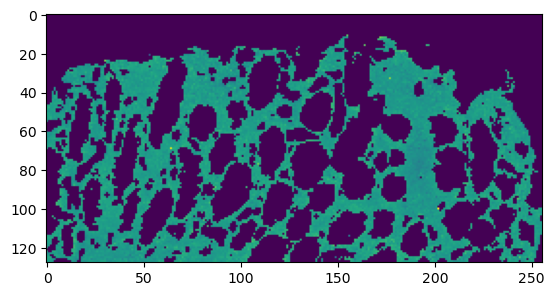

88


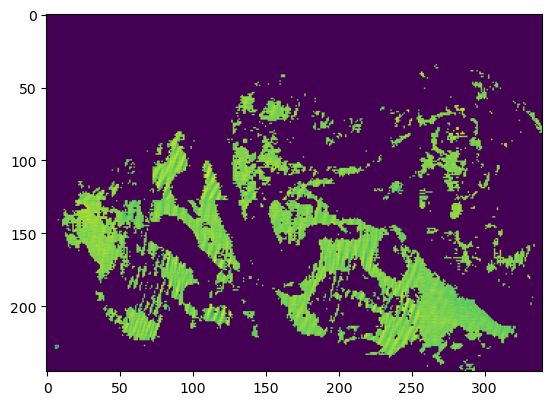

89


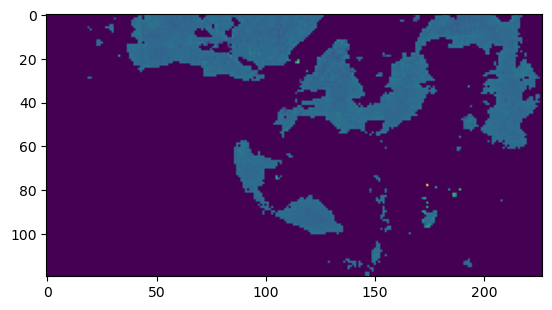

In [17]:
print(data.shape)
for sample in range(0,90):
    print(sample)
    s3 = samples[sample].calculate_full_data_view(coords, data, 50)
    plt.imshow(s3)
    plt.show()

In [46]:
print(max(classification))
sizes = []
for i, sample in enumerate(samples):
    print(i, sample.x_size, sample.y_size)
    sizes.append([sample.x_size, sample.y_size])

4
0 128 128
1 256 128
2 256 252
3 250 384
4 116 128
5 128 128
6 256 256
7 128 256
8 128 256
9 243 128
10 179 384
11 115 256
12 238 237
13 256 256
14 256 256
15 256 256
16 256 384
17 256 256
18 128 256
19 256 128
20 128 256
21 128 256
22 256 256
23 128 230
24 118 512
25 244 384
26 256 256
27 256 256
28 256 384
29 125 120
30 339 256
31 112 204
32 256 224
33 256 380
34 256 128
35 193 256
36 108 256
37 128 128
38 124 256
39 128 256
40 128 453
41 256 183
42 253 384
43 229 256
44 116 256
45 219 199
46 128 245
47 235 200
48 215 168
49 128 252
50 128 256
51 128 128
52 128 125
53 256 251
54 128 128
55 128 128
56 190 256
57 198 379
58 210 256
59 115 256
60 235 183
61 256 256
62 256 384
63 128 128
64 106 384
65 121 256
66 255 384
67 242 128
68 215 256
69 128 128
70 128 128
71 128 128
72 124 128
73 128 123
74 128 128
75 384 256
76 256 256
77 256 381
78 128 256
79 256 256
80 127 256
81 120 128
82 200 254
83 256 237
84 224 256
85 128 116
86 128 256
87 128 256
88 248 352
89 127 233


In [50]:
unique, counts = np.unique(sizes, axis=0, return_counts = True)
for i, unique_size in enumerate(unique):
    print(unique_size, counts[i])

[106 384] 1
[108 256] 1
[112 204] 1
[115 256] 2
[116 128] 1
[116 256] 1
[118 512] 1
[120 128] 1
[121 256] 1
[124 128] 1
[124 256] 1
[125 120] 1
[127 233] 1
[127 256] 1
[128 116] 1
[128 123] 1
[128 125] 1
[128 128] 11
[128 230] 1
[128 245] 1
[128 252] 1
[128 256] 10
[128 453] 1
[179 384] 1
[190 256] 1
[193 256] 1
[198 379] 1
[200 254] 1
[210 256] 1
[215 168] 1
[215 256] 1
[219 199] 1
[224 256] 1
[229 256] 1
[235 183] 1
[235 200] 1
[238 237] 1
[242 128] 1
[243 128] 1
[244 384] 1
[248 352] 1
[250 384] 1
[253 384] 1
[255 384] 1
[256 128] 3
[256 183] 1
[256 224] 1
[256 237] 1
[256 251] 1
[256 252] 1
[256 256] 11
[256 380] 1
[256 381] 1
[256 384] 3
[339 256] 1
[384 256] 1


In [2]:
%load_ext autoreload
save_directory = "/local/scratch/Data/TROPHY/numpy/"
from Sample import Sample
import matplotlib.pyplot as plt
import numpy as np
samples = np.load(save_directory + "samples.npy", allow_pickle = True)
coords = np.load(save_directory + "coords.npy")
data = np.load(save_directory + "data.npy")
classification = np.load(save_directory + "classification.npy")
print(samples[0].layer_range)

s0_tests = samples[0].calculate_tests(data)
print(np.shape(s0_tests[0]))
s0_answers = samples[0].calculate_answers(classification)
print(s0_answers)


[range(0, 2445), range(2446, 3348), range(3349, 4466)]
(4466, 801)
(801,)
[3 3 3 ... 3 3 3]


(4466,)


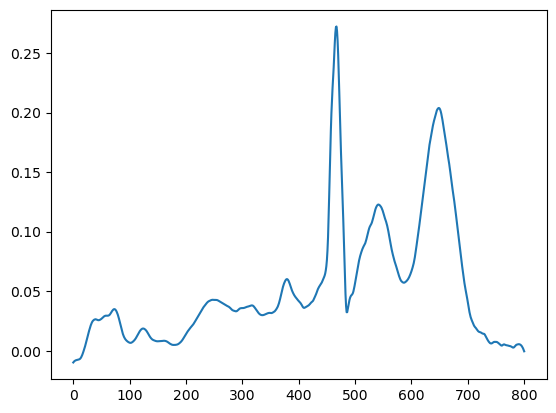

In [3]:
print(np.shape(s0_answers))
plt.plot(s0_tests[3000])

(4466, 801)
0
(16880, 801)
1
(12376, 801)
2
(17002, 801)
3
(5308, 801)
4
(7476, 801)
5
(9339, 801)
6
(10534, 801)
7
(11709, 801)
8
(10925, 801)
9
(16552, 801)
10
(7587, 801)
11
(3470, 801)
12
(31840, 801)
13
(38396, 801)
14
(18304, 801)
15
(34391, 801)
16
(20497, 801)
17
(12642, 801)
18
(5832, 801)
19
(9037, 801)
20
(10847, 801)
21
(11806, 801)
22
(5161, 801)
23
(11659, 801)
24
(14702, 801)
25
(19566, 801)
26
(14174, 801)
27
(39060, 801)
28
(3101, 801)
29
(41998, 801)
30
(2996, 801)
31
(7696, 801)
32
(10486, 801)
33
(12878, 801)
34
(5886, 801)
35
(6798, 801)
36
(7746, 801)
37
(9620, 801)
38
(9538, 801)
39
(7737, 801)
40
(5415, 801)
41
(35850, 801)
42
(10761, 801)
43
(3324, 801)
44
(8744, 801)
45
(10015, 801)
46
(15024, 801)
47
(7644, 801)
48
(10173, 801)
49
(5111, 801)
50
(5705, 801)
51
(6257, 801)
52
(25874, 801)
53
(5152, 801)
54
(4734, 801)
55
(20702, 801)
56
(18389, 801)
57
(13297, 801)
58
(5916, 801)
59
(5523, 801)
60
(17708, 801)
61
(48065, 801)
62
(6336, 801)
63
(6413, 801)
64
(

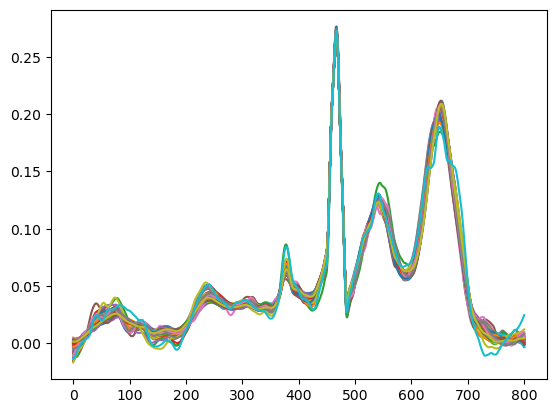

In [4]:
for i, sample in enumerate(samples):
    sample_tests = sample.calculate_tests(data)
    print(i)
    plt.plot(sample_tests[100])

(801,)


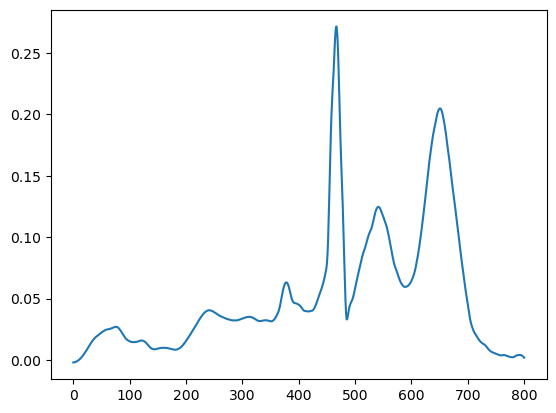

In [5]:
mean_spectrum = np.mean(data, axis=1)
print(np.shape(mean_spectrum))
plt.plot(mean_spectrum)

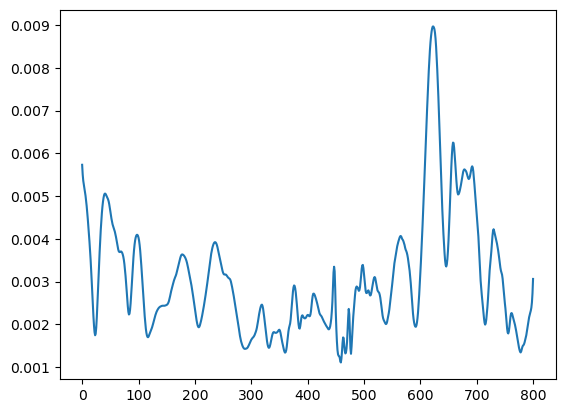

In [6]:
std_spectrum = np.std(data, axis=1)
plt.plot(std_spectrum)

In [7]:
normalised_data = (np.transpose(data) - mean_spectrum)/std_spectrum


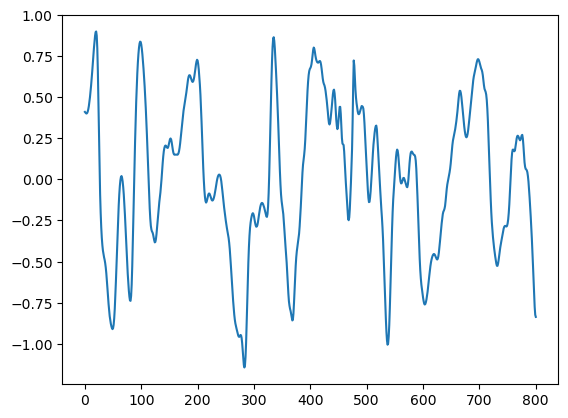

In [8]:
plt.plot(normalised_data[400])

In [24]:
np.save(save_directory + "normalised_data", normalised_data)

In [9]:
import copy
processing_data = copy.deepcopy(normalised_data)
maxs = []
processing_data = processing_data.flatten()
sorted_processing_data = np.sort(processing_data)[::-1]
print(sorted_processing_data[:1000])

[100.63174787  99.3969219   98.78115519  98.36090603  97.96028848
  96.19035177  95.82010331  94.98666922  91.856109    91.18846568
  91.09023308  90.7702955   89.408052    88.49968515  88.28503673
  87.73385292  87.65240418  87.4711237   87.01850474  86.10499693
  85.76531356  85.20818015  84.69847166  84.65766064  84.36662519
  84.11520166  81.71100499  81.11513149  81.02686609  79.73223809
  79.57628362  79.40300743  79.27849372  79.25531666  78.59922614
  78.56277754  78.04774818  77.9079986   77.36022715  76.98943876
  76.66459819  76.03629689  73.20418043  72.98616411  71.65960938
  71.13390091  70.93748977  70.77038433  70.31570188  70.10211261
  69.59273548  69.04287278  68.85315131  68.63970363  68.59348687
  68.2156237   67.735899    67.71726713  67.556525    66.84654605
  66.76910171  64.88581081  64.31353632  63.78013938  63.66359382
  63.59470802  62.32711679  61.75947219  60.43790558  59.99187967
  59.59408662  59.39417329  58.26222856  58.25594454  57.93120945
  57.87646

In [32]:
print(np.shape(normalised_data))
max_indices = np.where(normalised_data.flatten() > 60)
outlier_spectra = np.array(max_indices[0]/801, dtype=np.int64)
outlier_spectra = np.unique(outlier_spectra)
print(max_indices[0]/801)

(1192554, 801)
[  38079.79275905   38079.79400749   38079.79525593   38079.79650437
   38079.79775281   38079.79900125   38079.80024969   38079.80149813
   38079.80274657  626786.14357054  626786.14481898  626786.14606742
  626786.14731586  626786.14856429  626786.14981273  626786.15106117
  626786.15230961  626786.15355805  626786.15480649  626786.43071161
  626786.43196005  626786.43320849  626786.43445693  626786.43570537
  626786.43695381  626786.43820225  626786.43945069  626786.44069913
  627459.80024969  627459.80149813  627459.80274657  627459.80399501
  627459.80524345  628280.65543071  628280.65667915  628280.65792759
  628280.65917603  628280.66042447  628280.66167291  628280.66292135
  628280.66416979  628280.66541823  628280.66666667  628876.66666667
  628876.66791511  628876.66916355  628876.67041199  628876.67166042
  628876.67290886  628876.6741573   628876.67540574  630569.0948814
  630569.09612984  630569.09737828  630569.09862672  630569.09987516
  630569.1011236  11

In [1]:
%load_ext autoreload
save_directory = "/local/scratch/Data/TROPHY/numpy/"
from Sample import Sample
import matplotlib.pyplot as plt
import numpy as np
samples = np.load(save_directory + "samples.npy", allow_pickle = True)
coords = np.load(save_directory + "coords.npy")
data = np.load(save_directory + "data.npy")
normalised_data = np.load(save_directory + "normalised_data.npy")





In [2]:
positives = np.where(normalised_data > 0, normalised_data,0)
print("A")
negatives = np.where(normalised_data < 0, -normalised_data,0)
print("B")
positives_epsilon = positives + np.exp(1)
del(positives)
print("C")
negatives_epsilon = negatives + np.exp(1)
del(negatives)
print("D")
positives_log = np.log(positives_epsilon) - 1
del(positives_epsilon)
print("E")
negatives_log = np.log(negatives_epsilon) - 1
del(negatives_epsilon)
print("F")


A
B
C
D
E
F


In [6]:
final_logs = positives_log - negatives_log
np.save(save_directory + "normalised_log_data", final_logs)

1617467


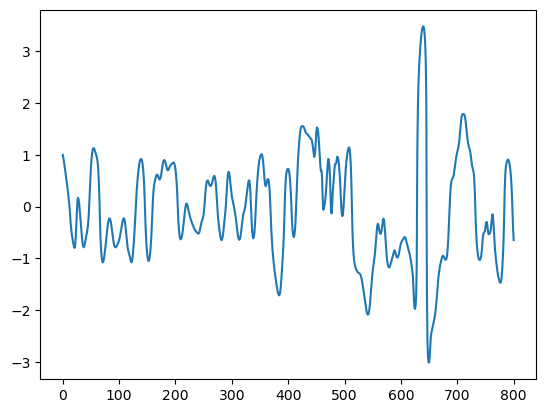

In [14]:
plt.plot(final_logs[38079])
print(len(np.where(final_logs.flatten() > 1)[0]))
final_logs = np.clip(final_logs, a_min=-2, a_max=2)
final_logs_normalised = final_logs / 2
np.save(save_directory + "normalised_clipped_log_data", final_logs_normalised)

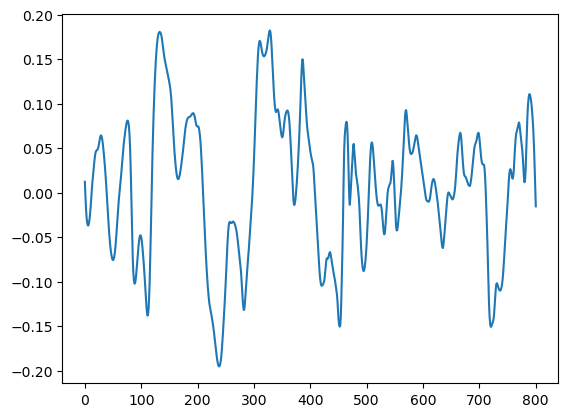

In [20]:
plt.plot(final_logs_normalised[800000])

In [1]:
%load_ext autoreload
save_directory = "/local/scratch/Data/TROPHY/numpy/"
from Sample import Sample
import matplotlib.pyplot as plt
import numpy as np
normalised_data = np.load(save_directory + "normalised_data.npy")

In [2]:
sigmoid_data = 1/(1+np.exp(-normalised_data))

In [10]:
np.save(save_directory + "sigmoid_normalised_data.npy", sigmoid_data)

In [6]:

%load_ext autoreload

import sys
import os
parent_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))
sys.path.insert(0, parent_dir)
save_directory = "/local/scratch/Data/TROPHY/numpy/"

import Processing.Sample
sys.modules['Sample'] = Processing.Sample
import matplotlib.pyplot as plt
import numpy as np
stroma_samples = np.load(save_directory + "stroma_samples.npy", allow_pickle = True)
stroma_coords = np.load(save_directory + "stroma_coords.npy")
stroma_data = np.load(save_directory + "stroma_data.npy")
stroma_classification = np.load(save_directory + "stroma_classification.npy")


non_stroma_samples = np.load(save_directory + "samples.npy", allow_pickle = True)
non_stroma_coords = np.load(save_directory + "coords.npy")
non_stroma_data = np.load(save_directory + "data.npy")
non_stroma_classification = np.load(save_directory + "classification.npy")




The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


20


/tmp/ipykernel_623673/1337073371.py:28: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(stroma_view))


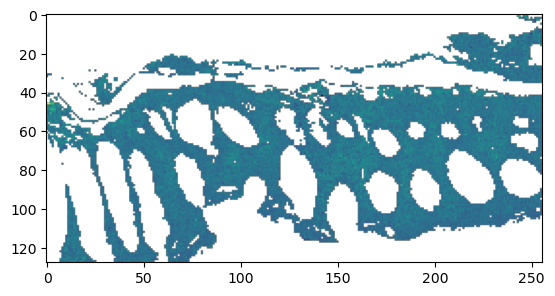

/tmp/ipykernel_623673/1337073371.py:30: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(non_stroma_view))


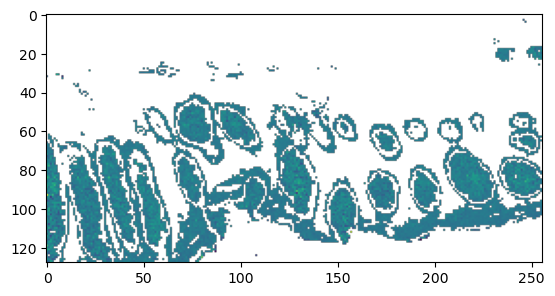

/tmp/ipykernel_623673/1337073371.py:32: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(add_matrices(stroma_view, non_stroma_view)))


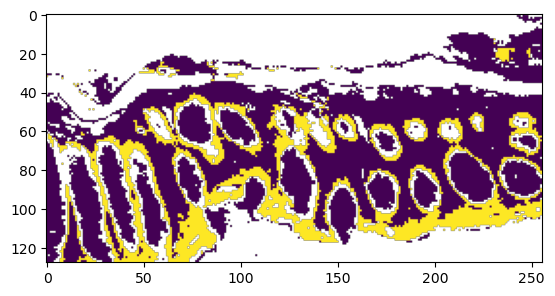

In [21]:
samples_of_interest = [20]

import numpy as np

def add_matrices(A: np.ndarray, B: np.ndarray) -> np.ndarray:
    # 1. desired output shape
    r = max(A.shape[0], B.shape[0])
    c = max(A.shape[1], B.shape[1])

    # 2. zero‑pad both to (r,c)
    A_pad = np.zeros((r, c), dtype=A.dtype)
    B_pad = np.zeros((r, c), dtype=B.dtype)

    A_pad[:A.shape[0], :A.shape[1]] = A
    B_pad[:B.shape[0], :B.shape[1]] = B

    # 3. element‑wise sum
    return A_pad + B_pad

for sample in samples_of_interest:
    print(sample)
    stroma_view = np.zeros([3,3])
    non_stroma_view = np.zeros([3,3])
    
    for channel in range(0, 801):
        stroma_view = add_matrices(np.array(stroma_samples[sample].calculate_full_data_view(stroma_coords, stroma_data, channel)), stroma_view)
        non_stroma_view = add_matrices(np.array(non_stroma_samples[sample].calculate_full_data_view(non_stroma_coords, non_stroma_data, channel)), non_stroma_view)
    plt.imshow(np.log(stroma_view))
    plt.show()
    plt.imshow(np.log(non_stroma_view))
    plt.show()
    plt.imshow(np.log(add_matrices(stroma_view, non_stroma_view)))
    plt.show()